# Data Visualization

In [1]:
# Print today's date
import datetime
print(f'Latest update: {datetime.date.today()}')

Latest update: 2024-09-04


## Load data

In [1]:
import pandas as pd
import sys
sys.path.append('../')
from source.bokeh_plots import *
from source.data_visualization import *
output_notebook()

file_path = '../data/'
model_name = 'AML Epigenomic Risk'

# Read the data
df = pd.read_excel(file_path + 'alma_main_results.xlsx', index_col=0).sort_index()
sig_results = pd.read_excel(file_path + 'signature_results.xlsx', index_col=0).sort_index()

df = df.join(sig_results)

# Define train and test samples
df_train = df[df['Train-Test']=='Train Sample']
df_test = df[df['Train-Test'] == 'Test Sample']

# Prognostic model samples
df_px = df[~df['Vital Status at 5y'].isna()]
df_px2 = df_px[df_px['Clinical Trial'].isin(['AAML0531', 'AAML1031', 'AAML03P1'])]
df_px2 = df_px2[df_px2['Sample Type'].isin(
    ['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow', 'Primary Blood Derived Cancer - Peripheral Blood'])]
df_px2 = df_px2[~df_px2['Patient_ID'].duplicated(keep='last')]

# drop the samples with missing labels for the ELN AML 2022 Diagnosis
df_dx = df_train[~df_train['WHO 2022 Diagnosis'].isna()]

# exclude the classes with fewer than 5 samples
df_dx = df_dx[~df_dx['WHO 2022 Diagnosis'].isin(['AML with t(9;22); BCR::ABL1'])]


df_px_ = df_px.sort_values(by='P(Death) at 5y').reset_index().reset_index(names=['Percentile']).set_index('index')
df_px_['Percentile'] = df_px_['Percentile'] / len(df_px_['Percentile'])
df2 = df.join(df_px_[['Percentile']])

Loading BokehJS ...

## Interactive atlas

In [2]:
from source.bokeh_alma import *

plot_alma(df2, table=False)

## Patient Characteristics

### ALMA (unsupervised)

In [3]:
from tableone import TableOne
from datetime import date

columns = ['Hematopoietic Entity','Age (group years)','Sex',
            'Clinical Trial',]

mytable_cog = TableOne(df_train.reset_index(), columns,
                        overall=False, missing=False,
                        pval=False, pval_adjust=False,
                        htest_name=True,dip_test=True,
                        tukey_test=True, normal_test=True,

                        order={'FLT3 ITD':['Yes','No'],
                                'Age (group years)':['0-5','5-13','13-39','39-60'],
                                'MRD 1 Status': ['Positive'],
                                'Risk Group': ['High Risk', 'Standard Risk'],
                                'FLT3 ITD': ['Yes'],
                                'Leucocyte counts (10⁹/L)': ['≥30'],
                                'Age group (years)': ['≥10']})

mytable_cog.to_excel('../data/pt_characteristics_alma_model_' + str(date.today()) +'.xlsx')

mytable_cog.tabulate(tablefmt="html", 
                        # headers=[score_name,"",'Missing','Discovery','Validation','p-value','Statistical Test']
                        )

,,Overall
n,,3314
"Hematopoietic Entity, n (%)",Acute lymphoblastic leukemia (ALL),700 (28.3)
,Acute myeloid leukemia (AML),1213 (49.1)
,Acute promyelocytic leukemia (APL),31 (1.3)
,Mixed phenotype acute leukemia (MPAL),50 (2.0)
,Myelodysplastic syndrome (MDS or MDS-like),225 (9.1)
,Otherwise-Normal (Control),251 (10.2)
"Age (group years), n (%)",0-5,480 (24.1)
,5-13,483 (24.2)
,13-39,663 (33.2)


### Fine-tuned (supervised) Dx and Px models

In [4]:
columns = ['Age (years)','Age group (years)','Sex','Race or ethnic group',
            'Hispanic or Latino ethnic group', 'MRD 1 Status',
            'Leucocyte counts (10⁹/L)', 'BM leukemic blasts (%)',
            'Risk Group','FLT3 ITD', 'Clinical Trial']

df_test['Age (years)'] = df_test['Age (years)'].astype(float)

# join discovery clinical data with validation clinical data
all_cohorts = pd.concat([df_dx, df_px2, df_test],
                         axis=0, keys=['Dx Discovery','Px Discovery' ,'Validation'],
                         names=['cohort']).reset_index()

# columns = ['Age group (years)','Sex', 'MRD 1 Status',
#             'Leucocyte counts (10⁹/L)',
#             'Risk Group','FLT3 ITD', 'Treatment Arm','Clinical Trial']

mytable_cog = TableOne(all_cohorts, columns,
                        overall=False, missing=False,
                        pval=False, pval_adjust=False,
                        htest_name=True,dip_test=True,
                        tukey_test=True, normal_test=True,

                        order={'FLT3 ITD':['Yes','No'],
                                'Race or ethnic group':['White','Black or African American','Asian'],
                                'MRD 1 Status': ['Positive'],
                                'Risk Group': ['High Risk', 'Standard Risk'],
                                'FLT3 ITD': ['Yes'],
                                'Leucocyte counts (10⁹/L)': ['≥30'],
                                'Age group (years)': ['≥10']},
                                groupby='cohort')

mytable_cog.to_excel('../data/pt_characteristics_fine-tuned_models_' + str(date.today()) +'.xlsx')

mytable_cog.tabulate(tablefmt="html", 
                        # headers=[score_name,"",score_name,'Validation','p-value','Statistical Test']
)

,,Dx Discovery,Px Discovery,Validation
n,,2467,946,201
"Age (years), mean (SD)",,19.2 (19.7),9.4 (6.3),8.8 (6.0)
"Age group (years), n (%)",≥10,528 (47.5),463 (48.9),95 (47.7)
,<10,584 (52.5),483 (51.1),104 (52.3)
"Sex, n (%)",Female,707 (50.4),468 (49.5),87 (43.3)
,Male,697 (49.6),478 (50.5),114 (56.7)
"Race or ethnic group, n (%)",White,1061 (80.5),697 (79.1),143 (71.9)
,Black or African American,131 (9.9),102 (11.6),32 (16.1)
,Asian,65 (4.9),43 (4.9),1 (0.5)
,American Indian or Alaska Native,7 (0.5),5 (0.6),


### By prognostic group

#### Discovery

AML Epigenomic Risk

In [5]:
def pt_characteristics_by_model(df, model_name, traintest = 'discovery'):
        columns = ['Age (years)','Age group (years)','Sex','Race or ethnic group',
                'Hispanic or Latino ethnic group', 'MRD 1 Status',
                'Leucocyte counts (10⁹/L)', 'BM leukemic blasts (%)',
                'Risk Group', 'Clinical Trial','FLT3 ITD', 'Treatment Arm']

        mytable_cog = TableOne(df, columns,
                                overall=False, missing=False,
                                pval=True, pval_adjust=False,
                                htest_name=True,dip_test=True,
                                tukey_test=True, normal_test=True,

                                order={'FLT3 ITD':['Yes','No'],
                                        'Race or ethnic group':['White','Black or African American','Asian'],
                                        'MRD 1 Status': ['Positive'],
                                        'Risk Group': ['High Risk', 'Standard Risk'],
                                        'FLT3 ITD': ['Yes'],
                                        'Leucocyte counts (10⁹/L)': ['≥30'],
                                        'Age group (years)': ['≥10']},
                                groupby=model_name)

        mytable_cog.to_excel('../data/pt_characteristics_'+ model_name +'_' + traintest + '_' + str(date.today()) + '.xlsx')

        return(mytable_cog.tabulate(tablefmt="html", 
                                headers=[model_name + ' ' + traintest,"",'High','Low','p-value','Statistical Test']))

pt_characteristics_by_model(df_px2, model_name, 'Discovery')

AML Epigenomic Risk Discovery,,High,Low,p-value,Statistical Test
n,,442,504,,
"Age (years), mean (SD)",,8.6 (6.5),10.2 (6.1),<0.001,Two Sample T-test
"Age group (years), n (%)",≥10,192 (43.4),271 (53.8),0.002,Chi-squared
,<10,250 (56.6),233 (46.2),,
"Sex, n (%)",Female,222 (50.2),246 (48.8),0.712,Chi-squared
,Male,220 (49.8),258 (51.2),,
"Race or ethnic group, n (%)",White,324 (78.3),373 (79.9),0.676,Chi-squared (warning: expected count < 5)
,Black or African American,53 (12.8),49 (10.5),,
,Asian,19 (4.6),24 (5.1),,
,American Indian or Alaska Native,3 (0.7),2 (0.4),,


MethylScoreAML-37CpGs

In [6]:
pt_characteristics_by_model(df_px2, model_name='MethylScoreAML Categorical', traintest='Discovery')

MethylScoreAML Categorical Discovery,,High,Low,p-value,Statistical Test
n,,176,770,,
"Age (years), mean (SD)",,9.2 (6.5),9.5 (6.3),0.666,Two Sample T-test
"Age group (years), n (%)",≥10,88 (50.0),375 (48.7),0.820,Chi-squared
,<10,88 (50.0),395 (51.3),,
"Sex, n (%)",Female,86 (48.9),382 (49.6),0.924,Chi-squared
,Male,90 (51.1),388 (50.4),,
"Race or ethnic group, n (%)",White,131 (79.4),566 (79.1),0.138,Chi-squared (warning: expected count < 5)
,Black or African American,26 (15.8),76 (10.6),,
,Asian,5 (3.0),38 (5.3),,
,American Indian or Alaska Native,1 (0.6),4 (0.6),,


#### Validation

AML Epigenomic Risk

In [7]:
pt_characteristics_by_model(df_test, model_name, 'validation')

AML Epigenomic Risk validation,,High,Low,p-value,Statistical Test
n,,82,119,,
"Age (years), mean (SD)",,7.5 (6.1),9.6 (5.8),0.013,Two Sample T-test
"Age group (years), n (%)",≥10,30 (37.0),65 (55.1),0.018,Chi-squared
,<10,51 (63.0),53 (44.9),,
"Sex, n (%)",Female,36 (43.9),51 (42.9),0.998,Chi-squared
,Male,46 (56.1),68 (57.1),,
"Race or ethnic group, n (%)",White,59 (73.8),84 (70.6),0.589,Chi-squared (warning: expected count < 5)
,Black or African American,13 (16.2),19 (16.0),,
,Asian,1 (1.2),,,
,Native Hawaiian or other Pacific Islander,1 (1.2),1 (0.8),,


MethylScoreAML-37CpGs

In [8]:
pt_characteristics_by_model(df_test, model_name='MethylScoreAML Categorical', traintest='Validation')

MethylScoreAML Categorical Validation,,High,Low,p-value,Statistical Test
n,,48,153,,
"Age (years), mean (SD)",,7.8 (6.4),9.1 (5.8),0.207,Two Sample T-test
"Age group (years), n (%)",≥10,20 (42.6),75 (49.3),0.517,Chi-squared
,<10,27 (57.4),77 (50.7),,
"Sex, n (%)",Female,25 (52.1),62 (40.5),0.214,Chi-squared
,Male,23 (47.9),91 (59.5),,
"Race or ethnic group, n (%)",White,35 (74.5),108 (71.1),0.171,Chi-squared (warning: expected count < 5)
,Black or African American,8 (17.0),24 (15.8),,
,Asian,1 (2.1),,,
,Native Hawaiian or other Pacific Islander,1 (2.1),1 (0.7),,


## Kaplan-Meier Plots

### Overall study population

AML Epigenomic Risk

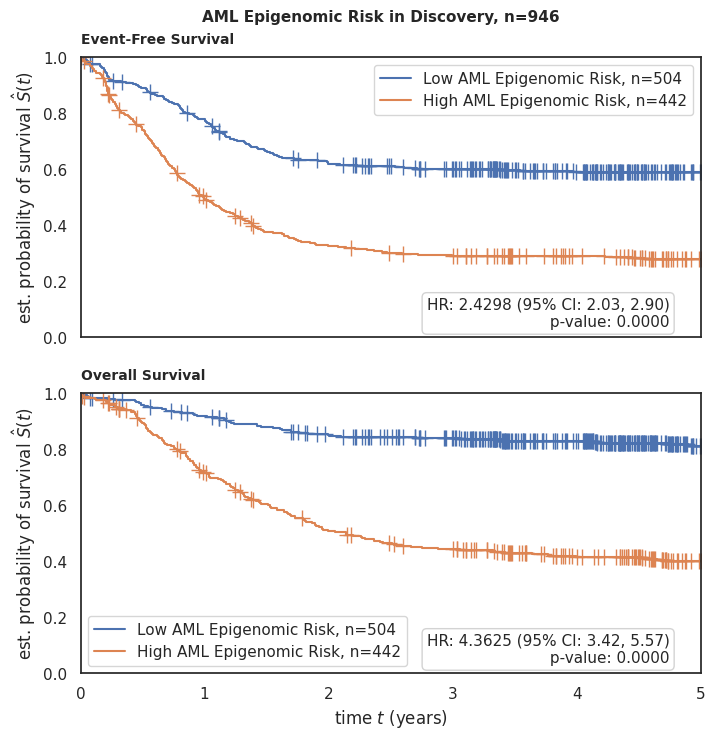

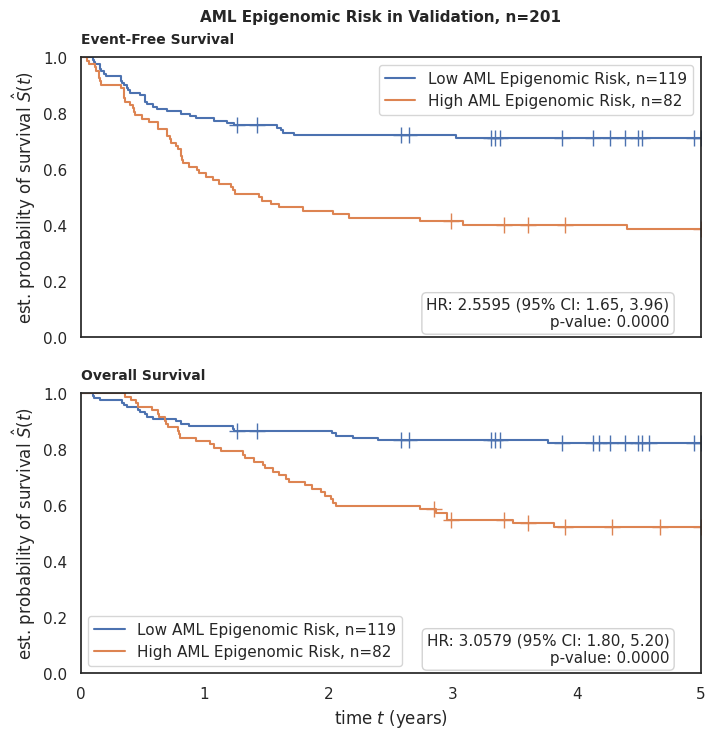

In [9]:

for dataset, trial in zip([df_px2, df_test], 
                          ['Discovery', 'Validation']):
    draw_kaplan_meier(model_name=model_name,
                        df=dataset,
                        save_survival_table=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=False,
                        trialname=trial,
                        figsize=(8,8))

MethylScoreAML-37CpGs

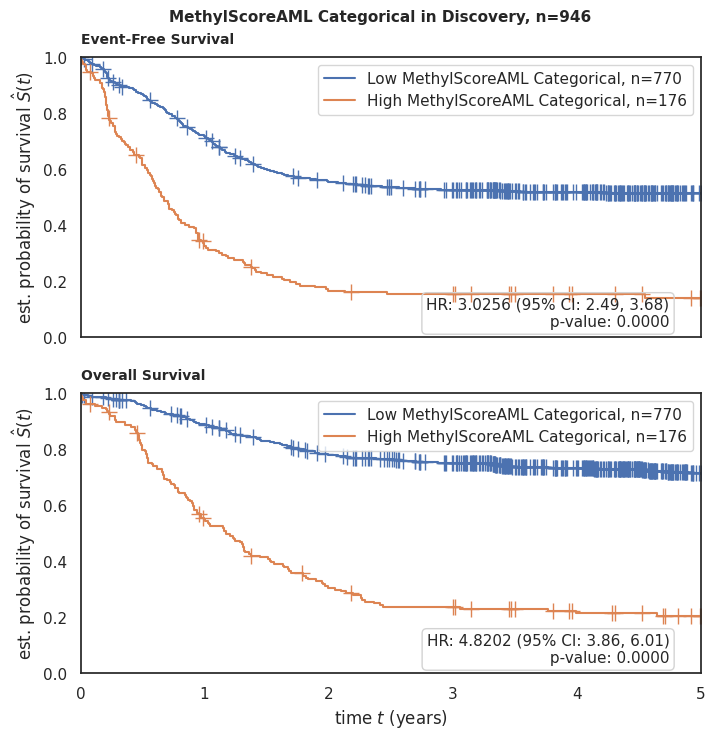

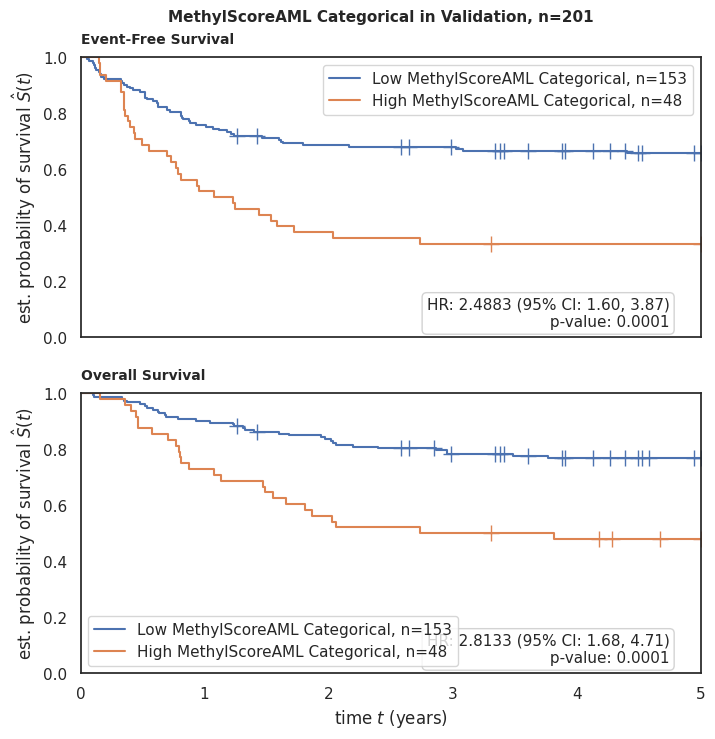

In [10]:
for dataset, trial in zip([df_px2, df_test], 
                          ['Discovery', 'Validation']):
    draw_kaplan_meier(model_name='MethylScoreAML Categorical',
                        df=dataset,
                        save_survival_table=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=False,
                        trialname=trial,
                        figsize=(8,8))

### Per risk group

AML Epigenomic Risk

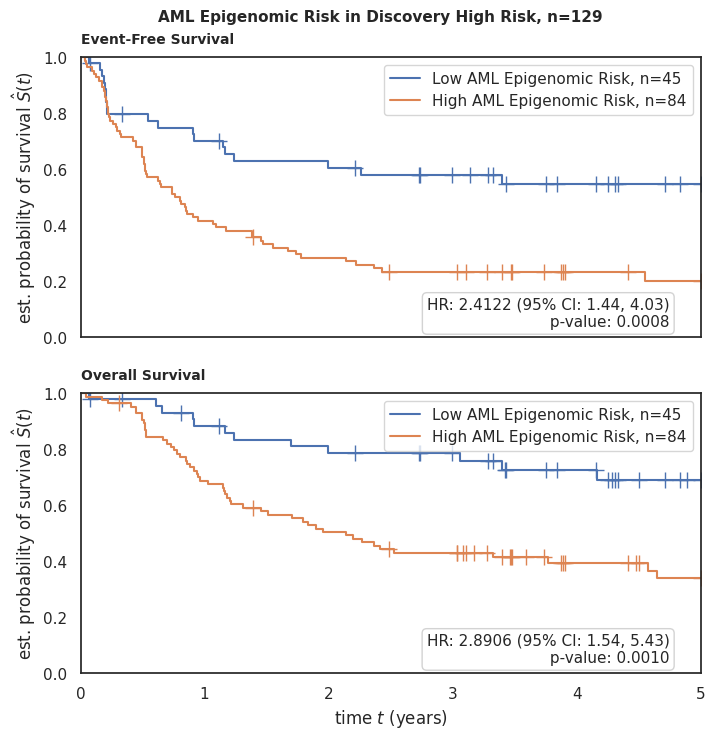

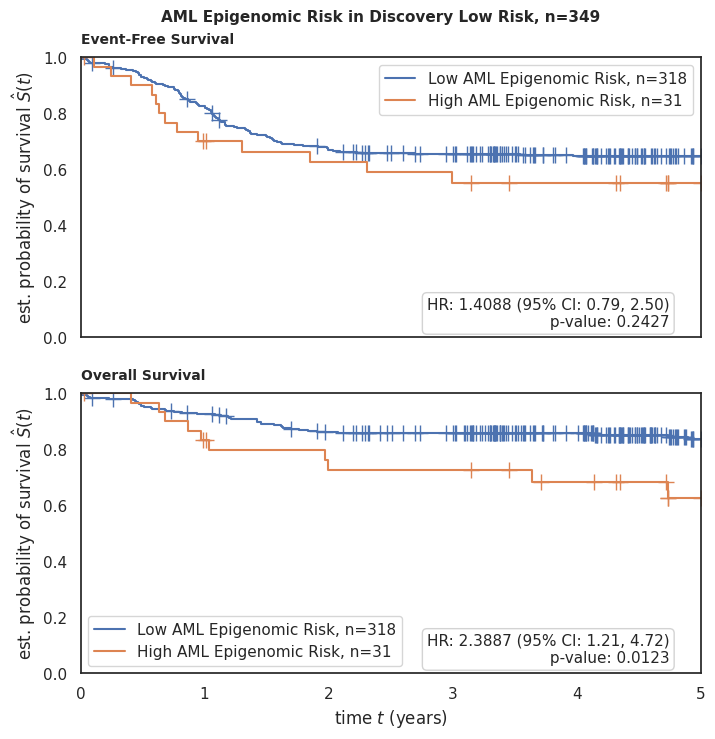

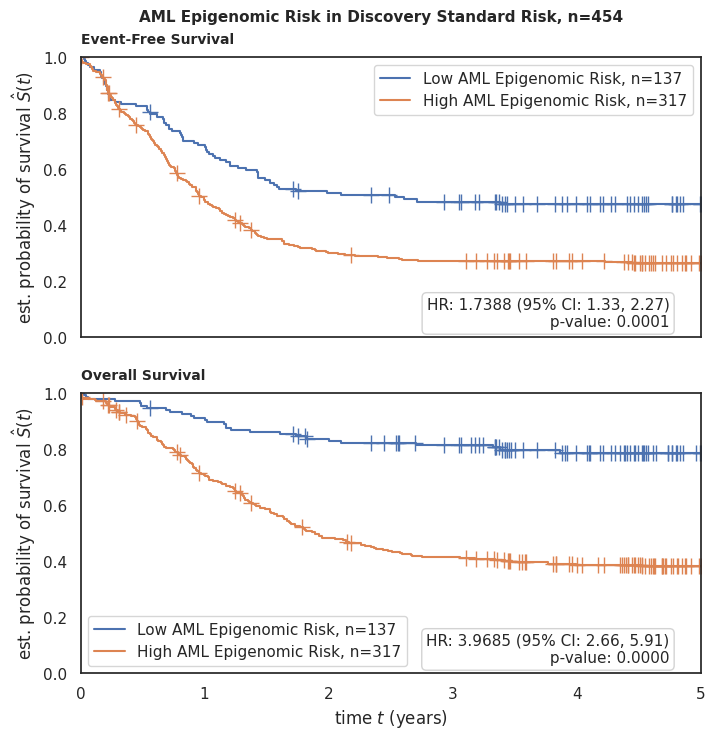

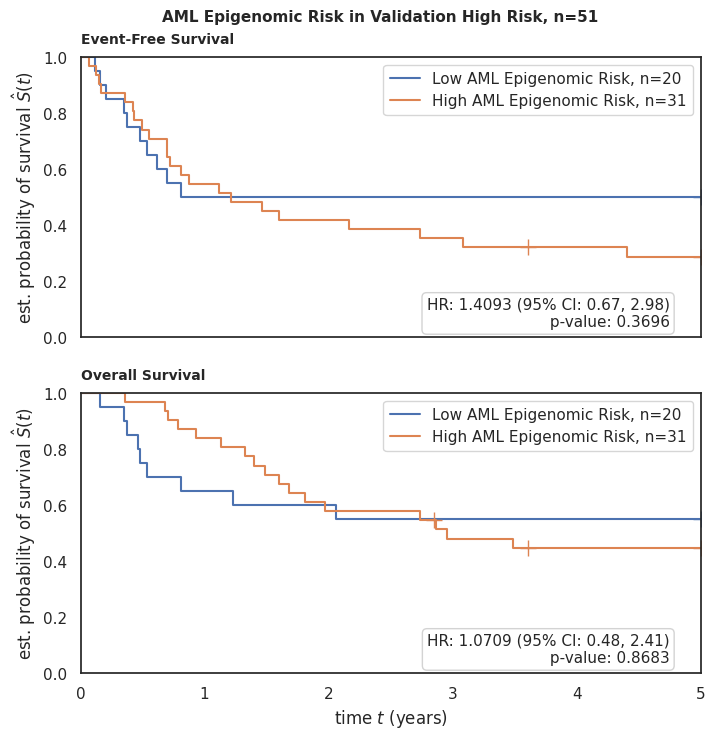

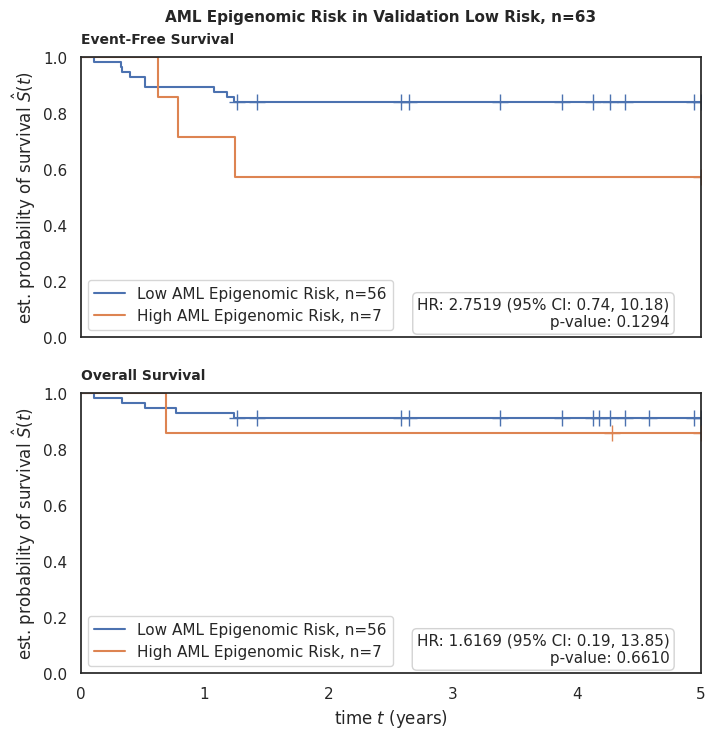

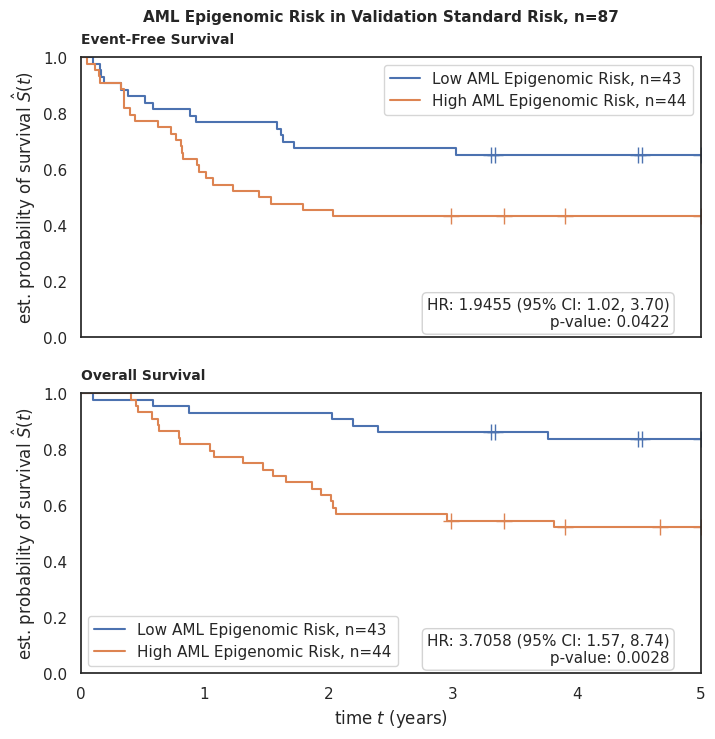

In [11]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'Validation']):

    risk_groups = ['High Risk', 'Low Risk', 'Standard Risk']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name,
            df=dataset[dataset['Risk Group'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group}',
            figsize=(8, 8))


MethylScoreAML-37CpGs

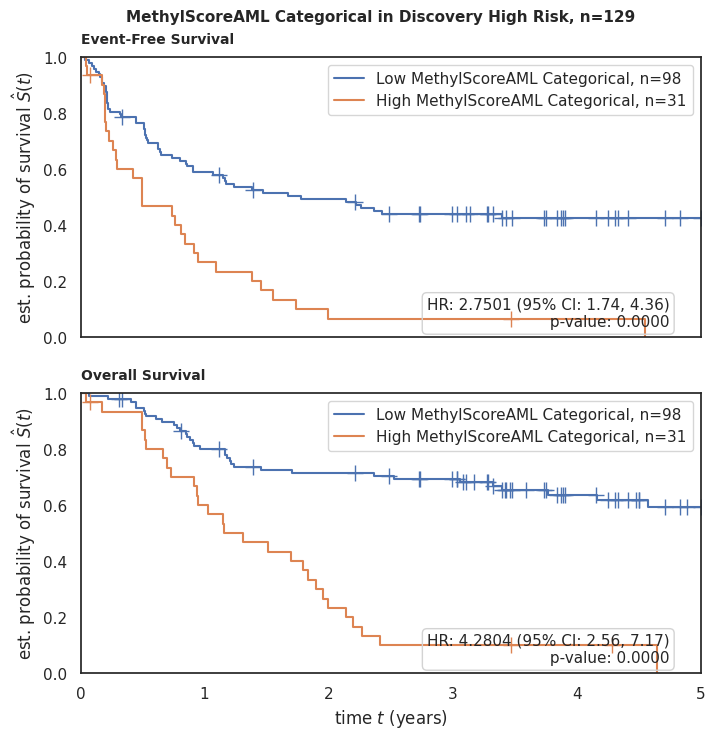

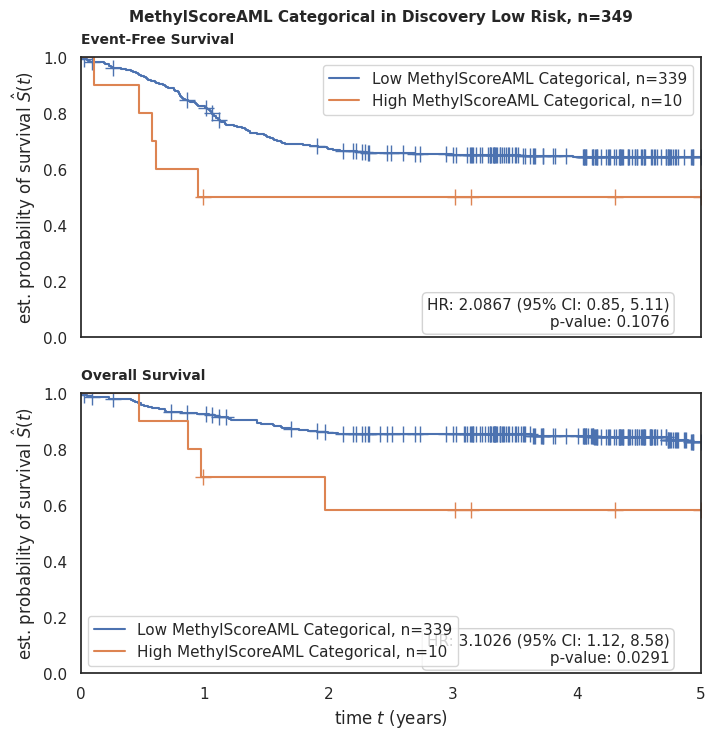

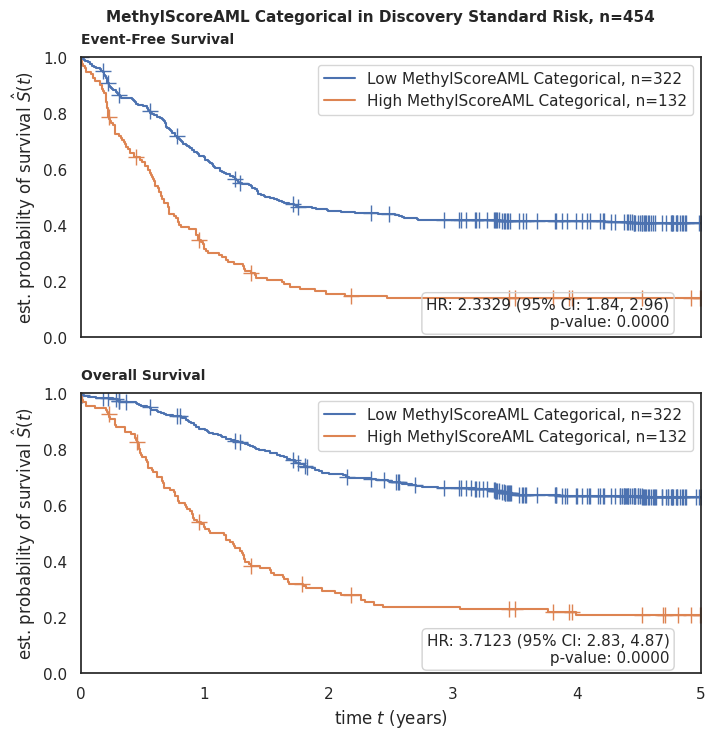

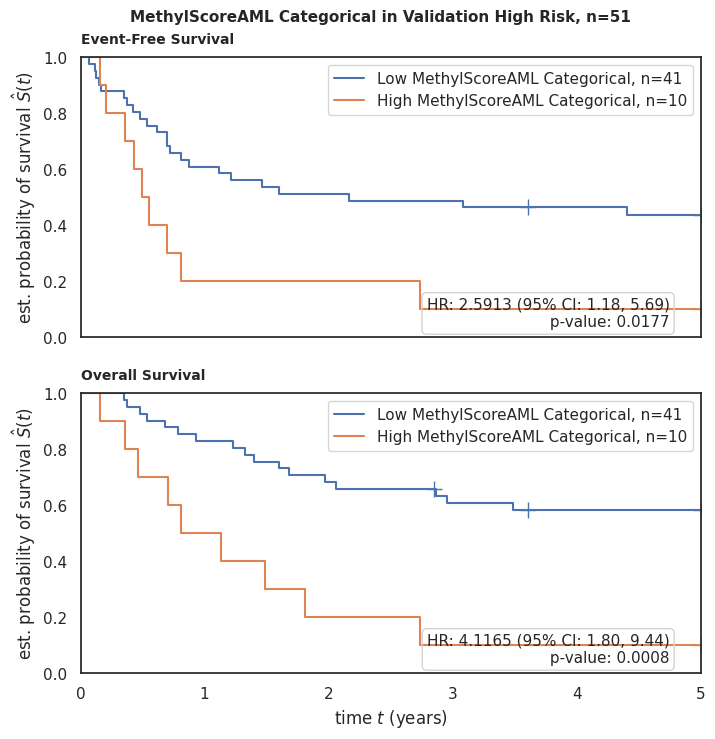

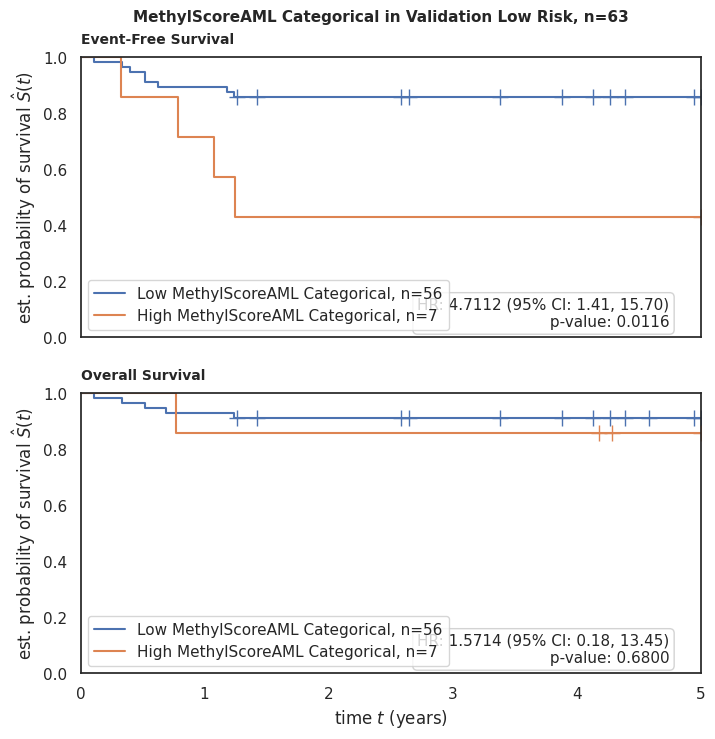

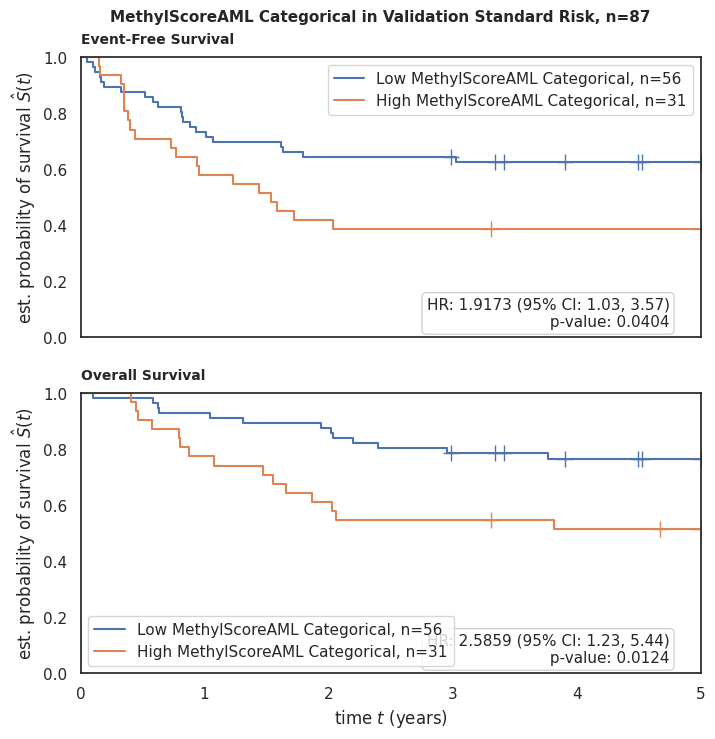

In [12]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'Validation']):

    risk_groups = ['High Risk', 'Low Risk', 'Standard Risk']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name= 'MethylScoreAML Categorical',
            df=dataset[dataset['Risk Group'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group}',
            figsize=(8, 8))

### Per risk group (AAML1831 COG)

AML Epigenomic Risk

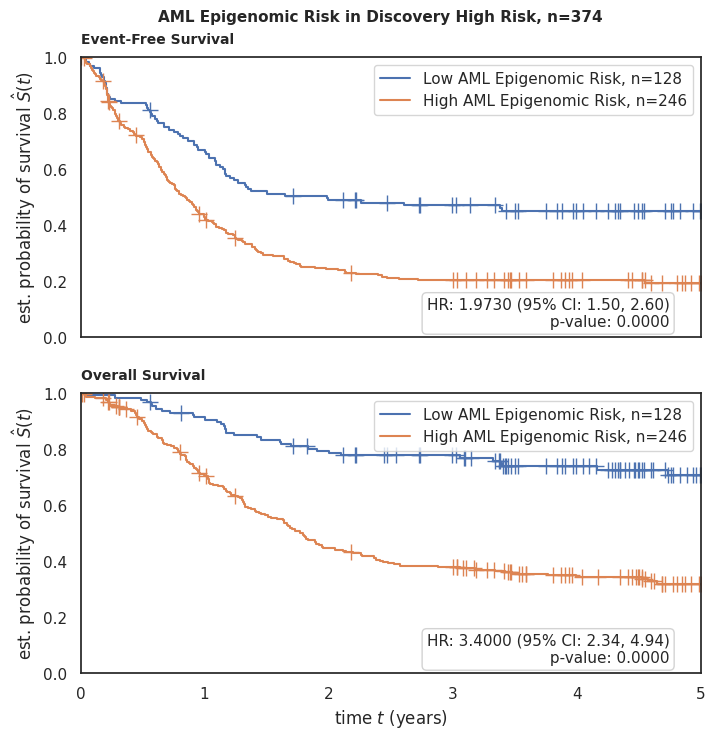

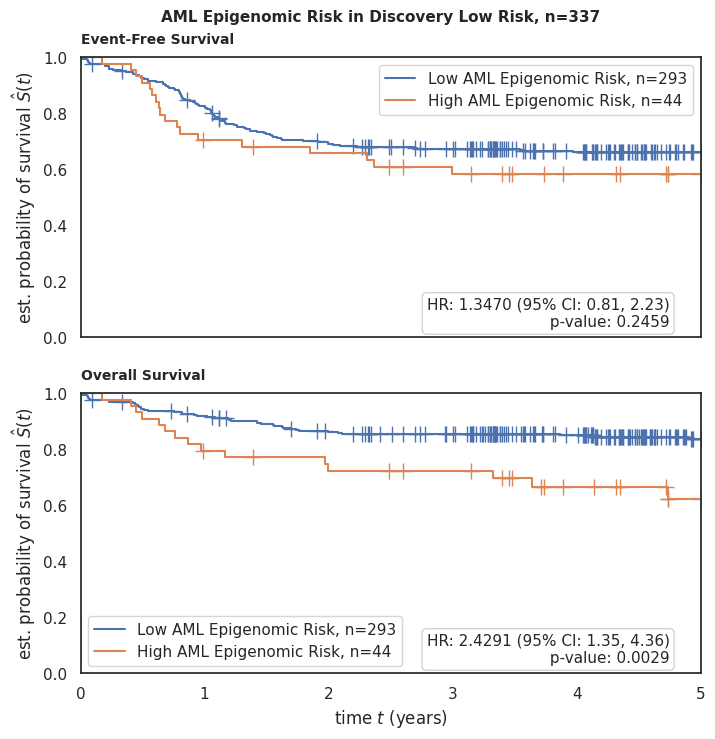

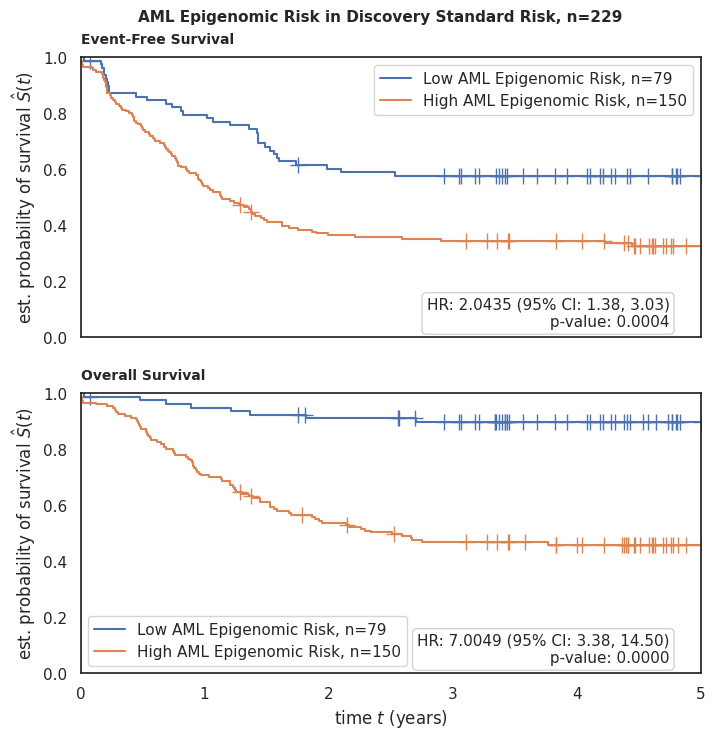

In [13]:
for dataset, trial in zip([df_px2],['Discovery']):

    risk_groups = ['High', 'Low', 'Standard']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name,
            df=dataset[dataset['Risk Group AAML1831'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group} Risk',
            figsize=(8, 8))


MethylScoreAML-37CpGs

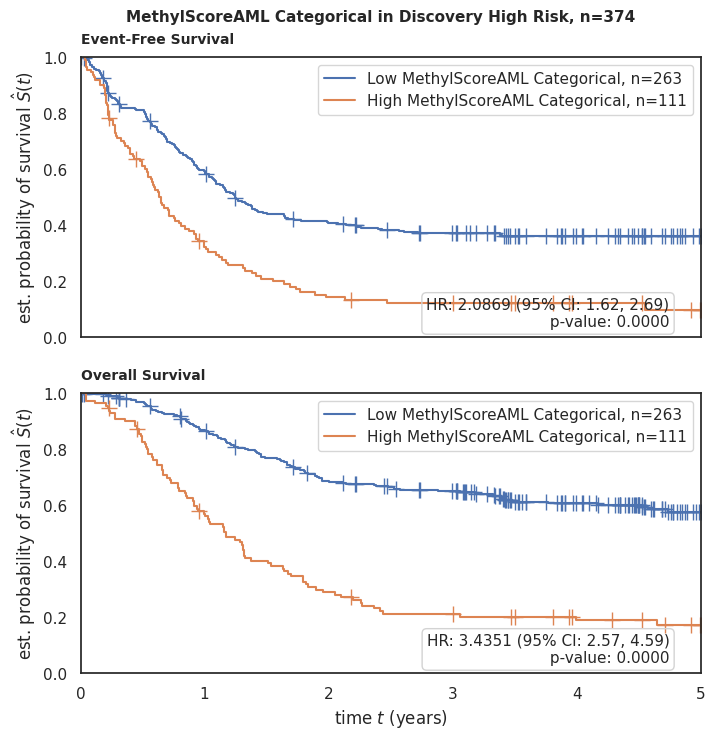

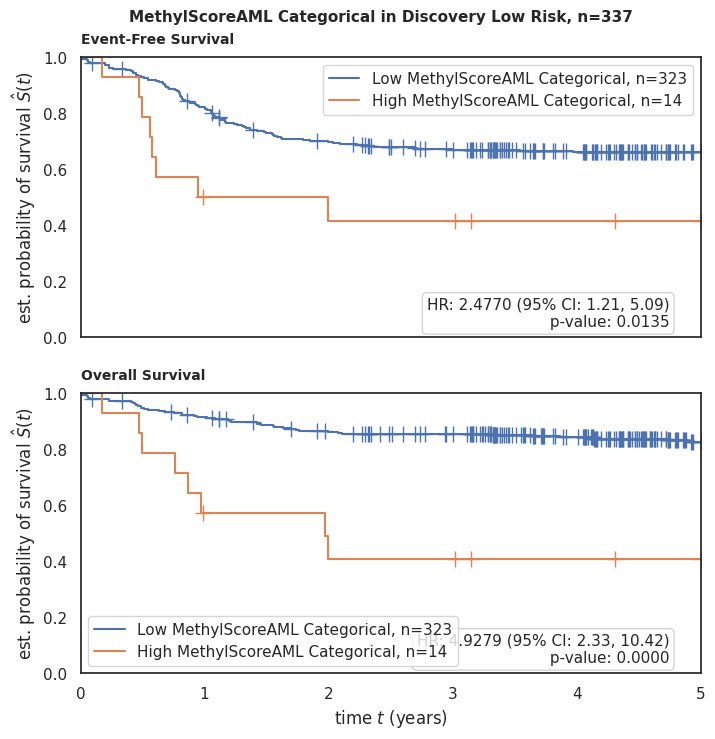

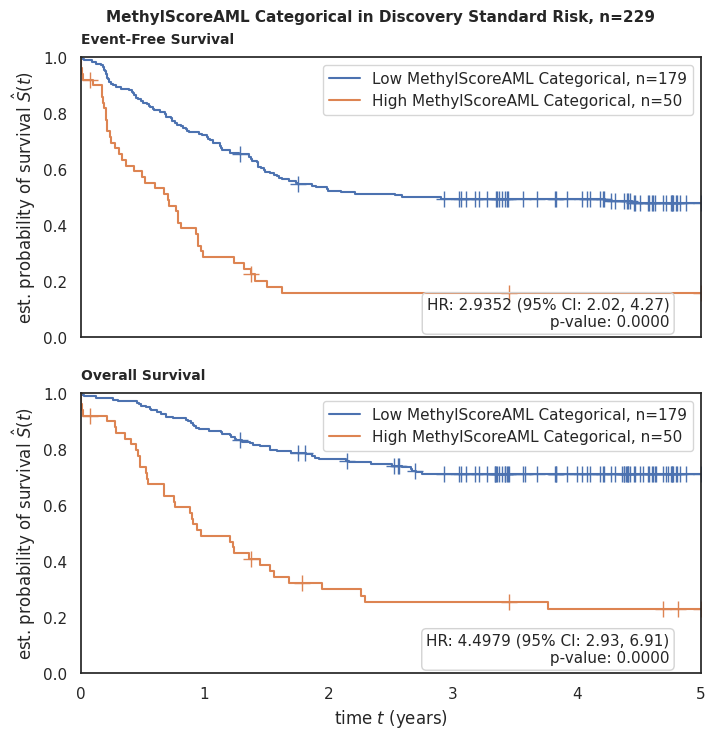

In [14]:
for dataset, trial in zip([df_px2],['Discovery']):

    risk_groups = ['High', 'Low', 'Standard']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name='MethylScoreAML Categorical',
            df=dataset[dataset['Risk Group AAML1831'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group} Risk',
            figsize=(8, 8))

## Forest Plots

### With MRD 1 and BM blast (%)

AML Epigenomic Risk

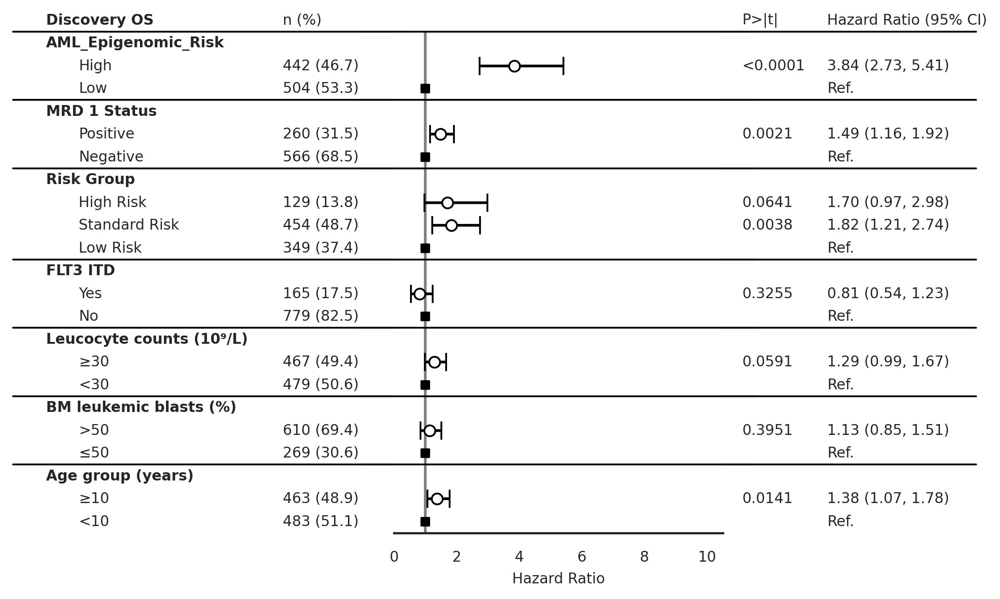

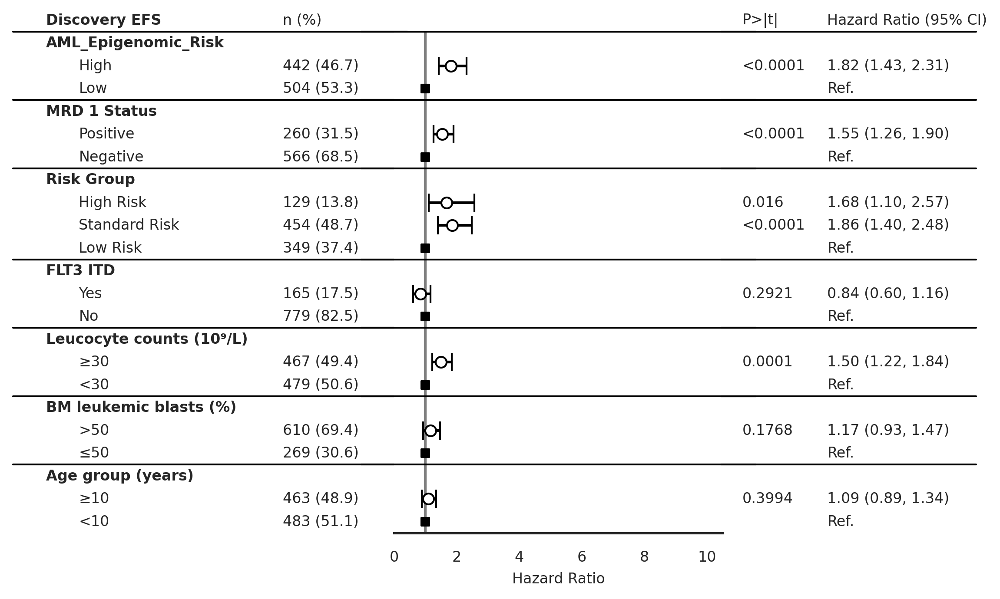

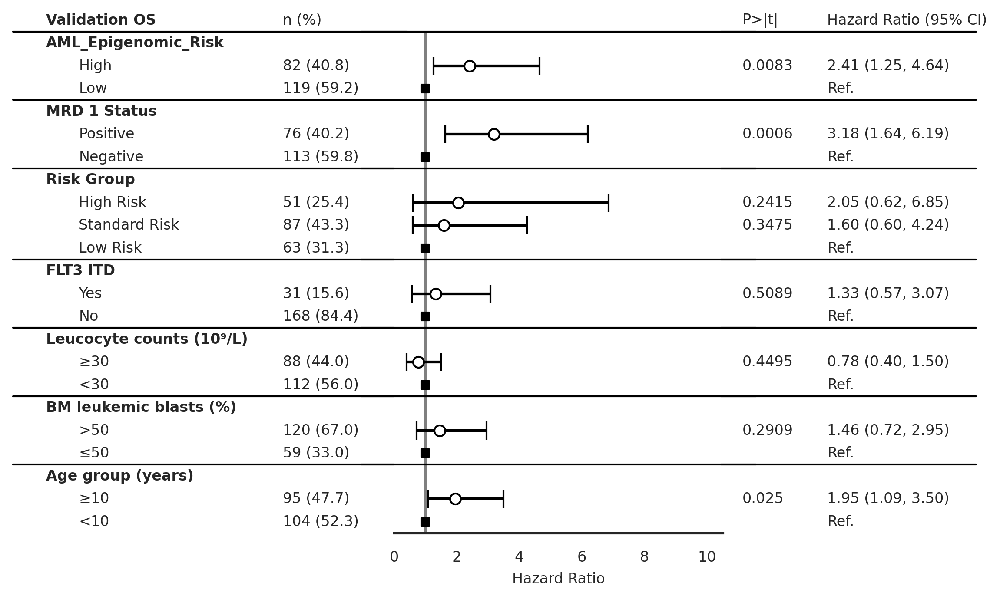

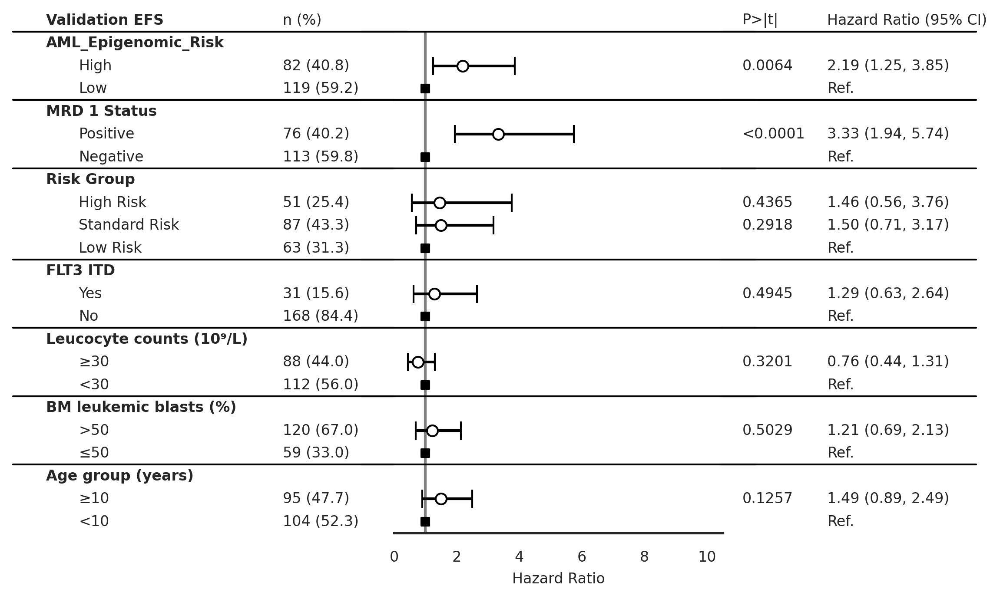

In [15]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'Validation']):
    
    df_ = dataset.copy()
    df_['BM leukemic blasts (%)'] = pd.cut(df_['BM leukemic blasts (%)'], bins=[0,50,100], labels=['≤50', '>50'])
    df_['AML_Epigenomic_Risk'] = df_['AML Epigenomic Risk']
    df_['MethylScoreAML_Categorical'] = df_['MethylScoreAML Categorical']
    df_['os_time_5y'] = df_['os.time at 5y']
    df_['os_evnt_5y'] = df_['os.evnt at 5y']
    df_['efs_time_5y'] = df_['efs.time at 5y']
    df_['efs_evnt_5y'] = df_['efs.evnt at 5y']

    draw_forest_plot_withBMblast(time='os_time_5y',
                        event='os_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)

    draw_forest_plot_withBMblast(time='efs_time_5y',
                        event='efs_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)


MethylScoreAML-37CpGs

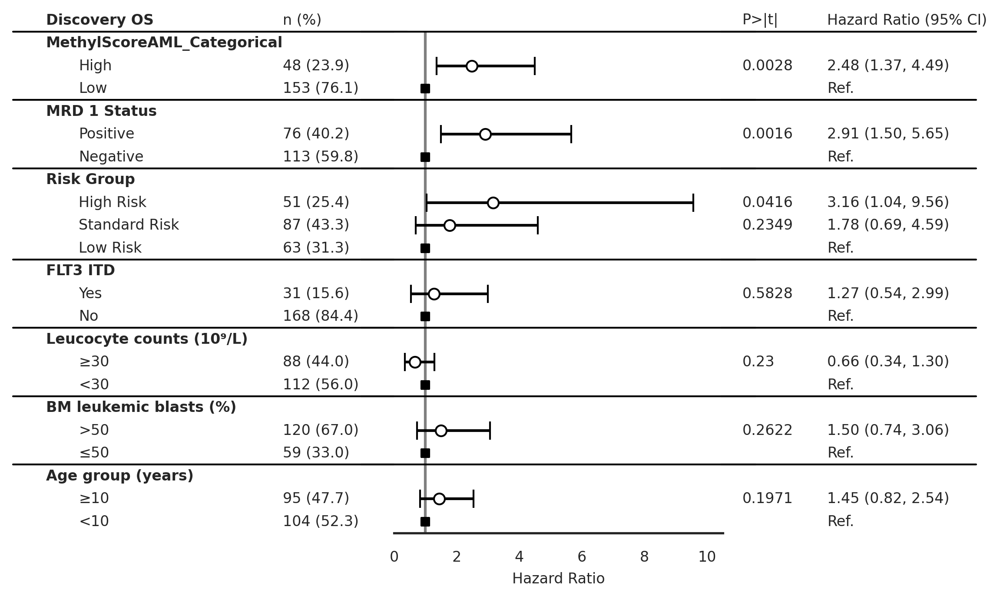

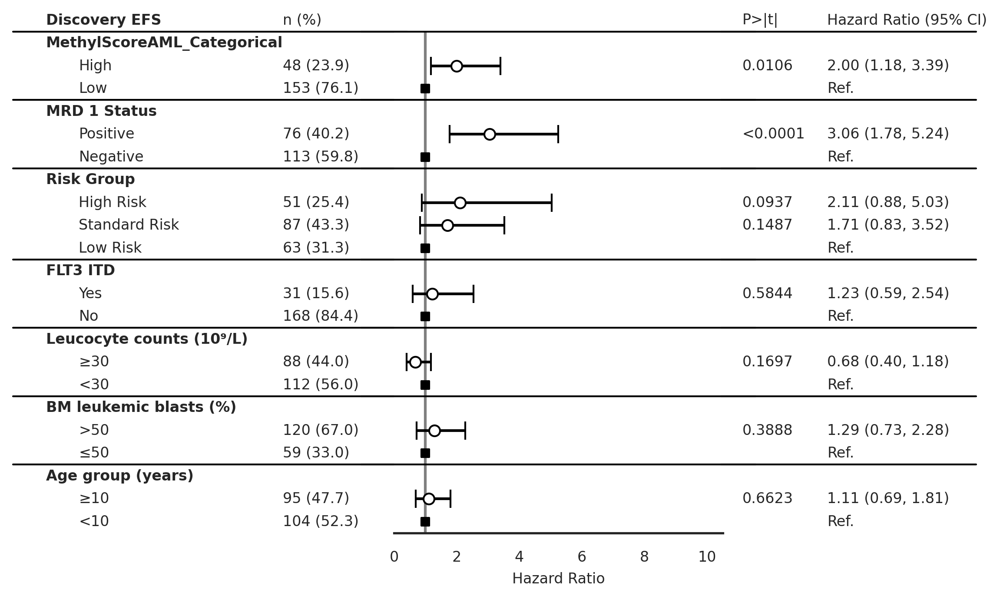

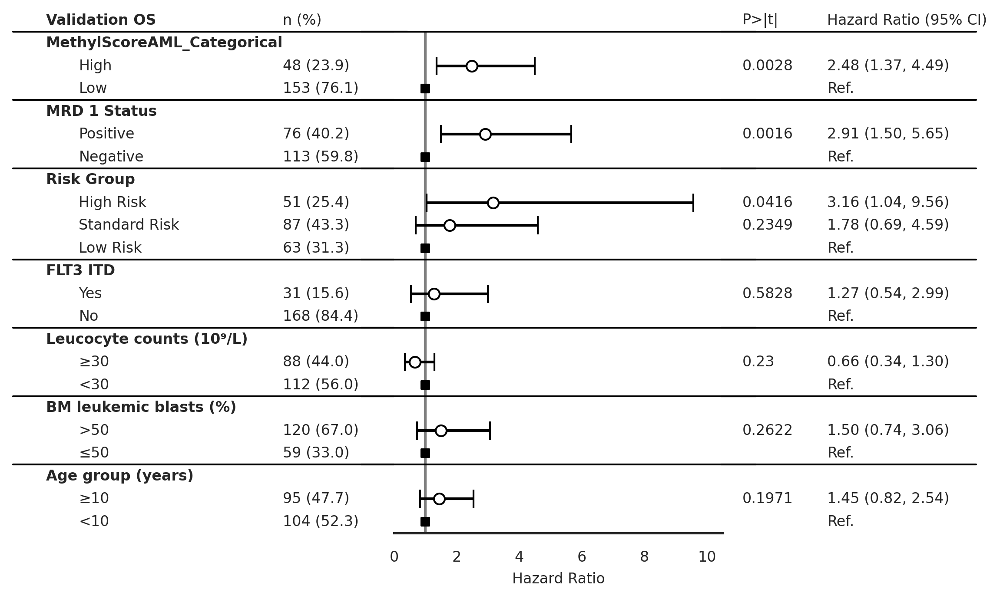

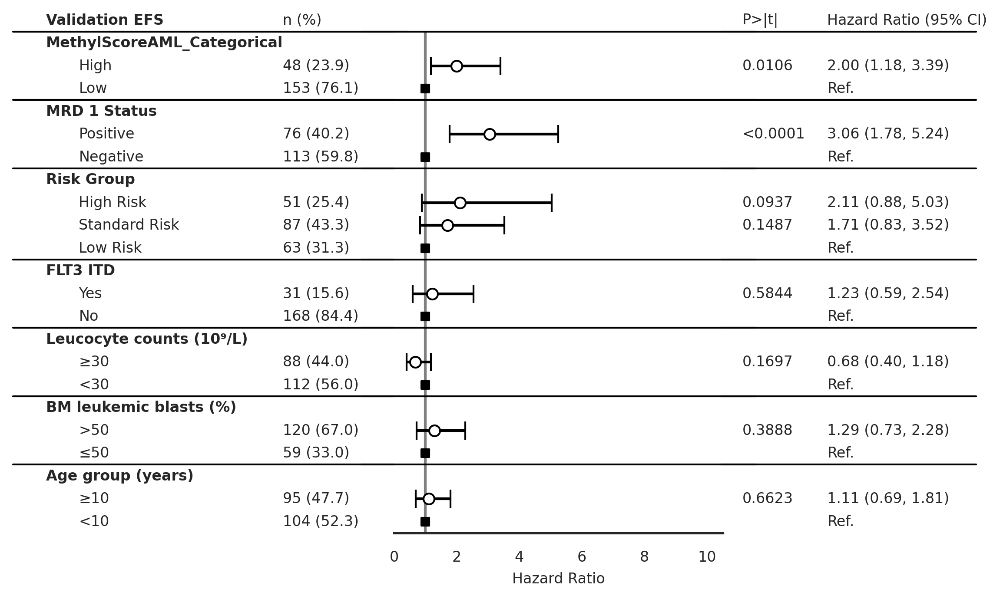

In [16]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'Validation']):


    draw_forest_plot_withBMblast(time='os_time_5y',
                        event='os_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='MethylScoreAML_Categorical',
                        save_plot=False)

    draw_forest_plot_withBMblast(time='efs_time_5y',
                        event='efs_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='MethylScoreAML_Categorical',
                        save_plot=False)

## ROC AUC performance

### Diagnostic Model

In [17]:
df_dx_auc_train, df_dx_dummies_train = process_dataset_for_multiclass_auc(df_dx)
df_dx_auc_cog, df_dx_dummies_cog = process_dataset_for_multiclass_auc(df_px2)
df_dx_auc_test, df_dx_dummies_test = process_dataset_for_multiclass_auc(df_test)
                                                                        
p1 = plot_multiclass_roc_auc(df_dx_auc_train, df_dx_dummies_train.columns, title='Discovery')
p2 = plot_multiclass_roc_auc(df_dx_auc_cog, df_dx_dummies_cog.columns, title='Discovery COG peds AML')
p3 = plot_multiclass_roc_auc(df_dx_auc_test, df_dx_dummies_test.columns, title='Validation')

# Create a gridplot
p = gridplot([
    [p1, p2, p3,],
    ], toolbar_location='above')

show(p)

### Prognostic models

#### Discovery

In [54]:
df_cat = df_px2[['os.evnt at 5y', 'MethylScoreAML Categorical', 'AML Epigenomic Risk']]
df_cont = df_px2[['os.evnt at 5y', 'MethylScoreAML', 'P(Death) at 5y']]

df_cont = df_cont.rename(columns={'P(Death) at 5y':'AML Epigenomic Risk (PaCMAP-LGBM)',
                                  'MethylScoreAML': 'MethylScoreAML (EWAS-CoxPH)'})

df_cat = df_cat.rename(columns={'AML Epigenomic Risk':'AML Epigenomic Risk (PaCMAP-LGBM)',
                                  'MethylScoreAML Categorical': 'MethylScoreAML (EWAS-CoxPH)'})

risk = df_px2[['Risk Group AAML1831','Risk Group']]

low_high_dict = {'Low': 0, 'Low Risk': 0,
                'Standard':0.5, 'Standard Risk': 0.5,
                'High': 1, 'High Risk': 1}

risk['Risk Group'] = risk['Risk Group'].map(low_high_dict)
risk['Risk Group AAML1831'] = risk['Risk Group AAML1831'].map(low_high_dict)

df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'].map(low_high_dict)
df_cat['MethylScoreAML (EWAS-CoxPH)'] = df_cat['MethylScoreAML (EWAS-CoxPH)'].map(low_high_dict)

df_cont_risk = df_cont.join(risk)
df_cat_risk = df_cat.join(risk)

df_cont_risk = df_cont_risk.fillna(0.5)
df_cat_risk = df_cat_risk.fillna(0.5)

def plot_roc_auc(df, target, title=None, color_option='colors1'):
    """
    Plots ROC AUC flexibly using Bokeh.

    """
    if color_option == 'colors1':
        colors = ['red','green','blue', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'black']
    elif color_option == 'colors2':
        colors = ['green','blue','red']
    else:
        colors = ['green','red','blue']
    
    if title:
        title_ = title + ', n=' + str(len(df))
    else:
        title_ = ''

    p = figure(title=title_,
               x_axis_label='False Positive Rate',
               y_axis_label='True Positive Rate',
               width=425, height=425,
               tools='save,reset,pan')
    
    p.line([0, 1], [0, 1], line_dash="dashed", color="gray", line_width=1)

    for column, color in zip(df.columns.difference([target]), colors):
        fpr, tpr, _ = roc_curve(df[target], df[column])
        roc_auc = auc(fpr, tpr)
        p.line(fpr, tpr, legend_label=f"{column} ({roc_auc:.2f})",
               color=color, line_width=2, alpha=0.8)


    p.legend.location = "bottom_right"
    p.legend.click_policy="hide"
    p.toolbar.logo = None
    p.legend.label_text_font_size = '8pt'
    p.legend.spacing = 2
    p.xaxis.axis_label_text_font_style = "normal"
    p.yaxis.axis_label_text_font_style = "normal"
    p.legend.background_fill_alpha = 0.8
    p.title.text_font_size = '10pt'

    return p

p1 = plot_roc_auc(df_cont_risk, 'os.evnt at 5y',title= 'Continuous (prob. of high risk)')
p2 = plot_roc_auc(df_cat_risk, 'os.evnt at 5y',title= 'Categorical (high-low risk)')

# Create a gridplot
p = gridplot([[p1, p2]], toolbar_location='above')

show(p)

#### Validation

In [55]:
df_cat = df_test[['os.evnt at 5y', 'MethylScoreAML Categorical', 'AML Epigenomic Risk']]
df_cont = df_test[['os.evnt at 5y', 'MethylScoreAML', 'P(Death) at 5y']]

df_cont = df_cont.rename(columns={'P(Death) at 5y':'AML Epigenomic Risk (PaCMAP-LGBM)',
                                  'MethylScoreAML': 'MethylScoreAML (EWAS-CoxPH)'})

df_cat = df_cat.rename(columns={'AML Epigenomic Risk':'AML Epigenomic Risk (PaCMAP-LGBM)',
                                  'MethylScoreAML Categorical': 'MethylScoreAML (EWAS-CoxPH)'})

risk = df_test[['Risk Group']]
risk['Risk Group'] = risk['Risk Group'].map(low_high_dict)

df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'].map(low_high_dict)
df_cat['MethylScoreAML (EWAS-CoxPH)'] = df_cat['MethylScoreAML (EWAS-CoxPH)'].map(low_high_dict)

df_cont_risk = df_cont.join(risk)
df_cat_risk = df_cat.join(risk)

# Rename `Risk Group` to `Risk Group AML02,08`
df_cont_risk = df_cont_risk.rename(columns={'Risk Group':'Risk Group AML02-08'})
df_cat_risk = df_cat_risk.rename(columns={'Risk Group':'Risk Group AML02-08'})

p1 = plot_roc_auc(df_cont_risk, 'os.evnt at 5y',title= 'Continuous (prob. of high risk)')
p2 = plot_roc_auc(df_cat_risk, 'os.evnt at 5y',title= 'Categorical (high-low risk)')

# Create a gridplot
p = gridplot([[p1, p2]], toolbar_location='above')

show(p)


## Sankey plots

```{note}
Sankey plots below compare the distribution of categories. The width of the lines is proportional to the number of patients in each group.
```

### Samples with annotated diagnosis info

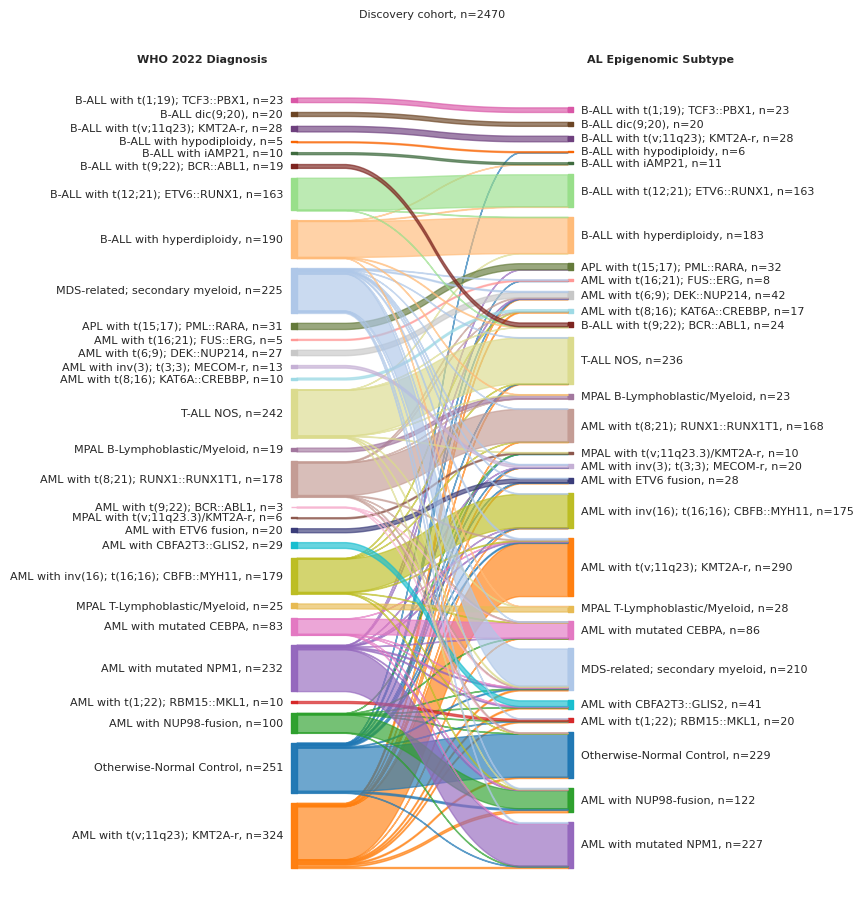

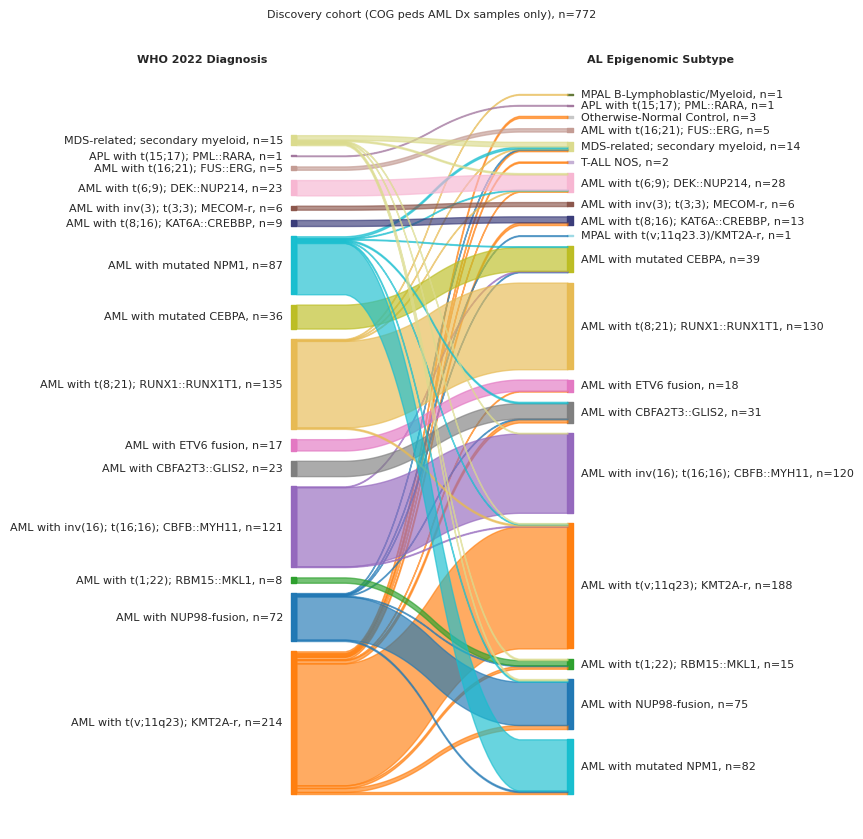

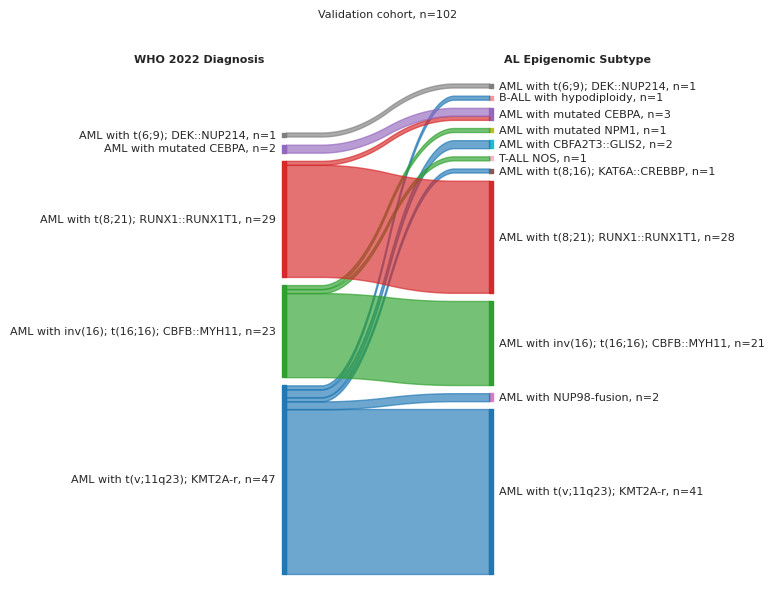

In [44]:
colors = get_custom_color_palette()


draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title='Discovery cohort', fig_size=(4, 11),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_px2, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(4, 10),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Validation cohort',fig_size=(3, 7),
                 fontsize=8, nan_action='drop')

### Predictions in samples for which no WHO 22 Dx data was available

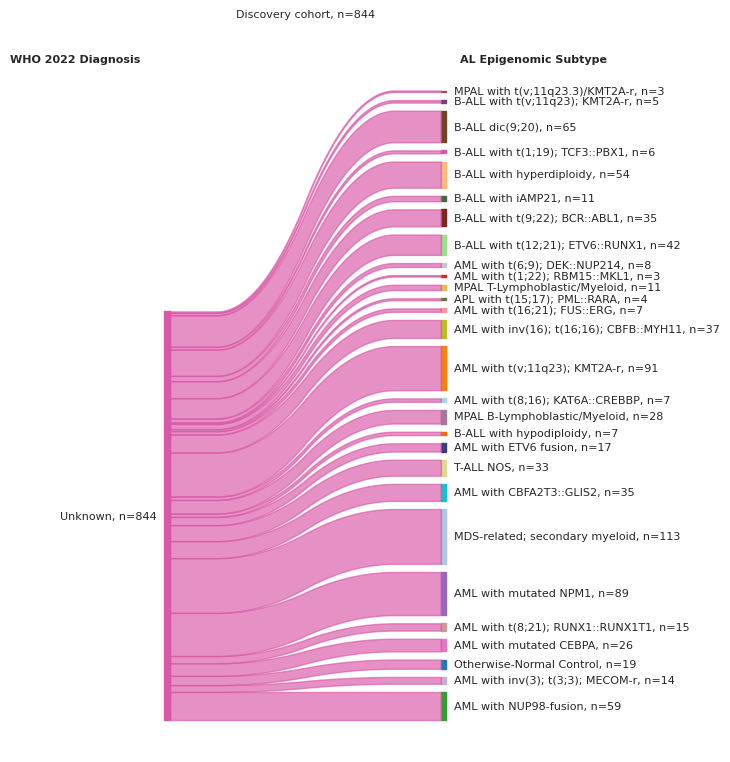

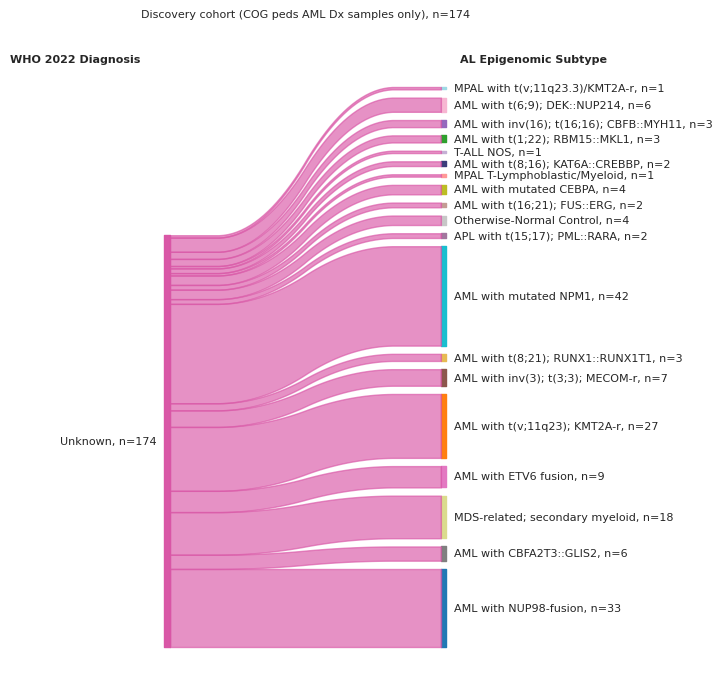

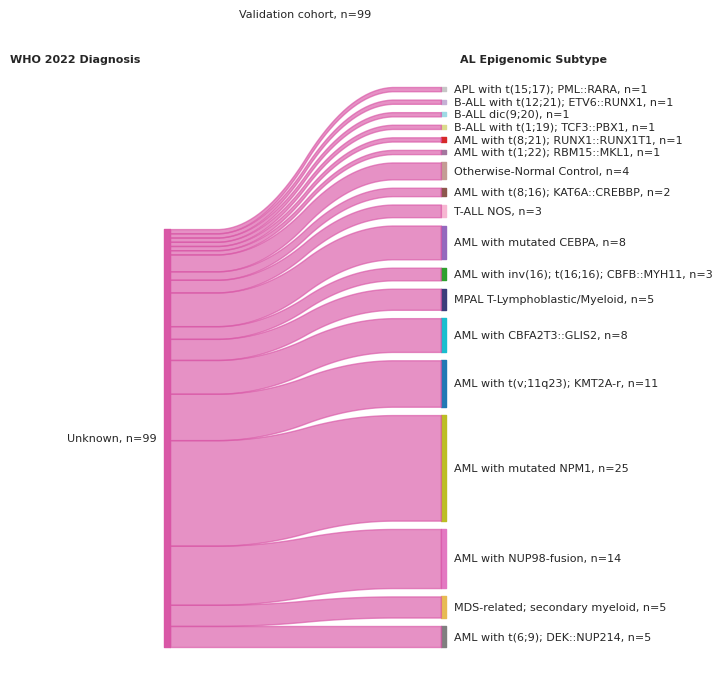

In [45]:
draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title='Discovery cohort', fig_size=(4, 9),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_px2, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(4, 8),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Validation cohort',fig_size=(4, 8),
                 fontsize=8, nan_action='keep only')

### Reason for unclassified samples

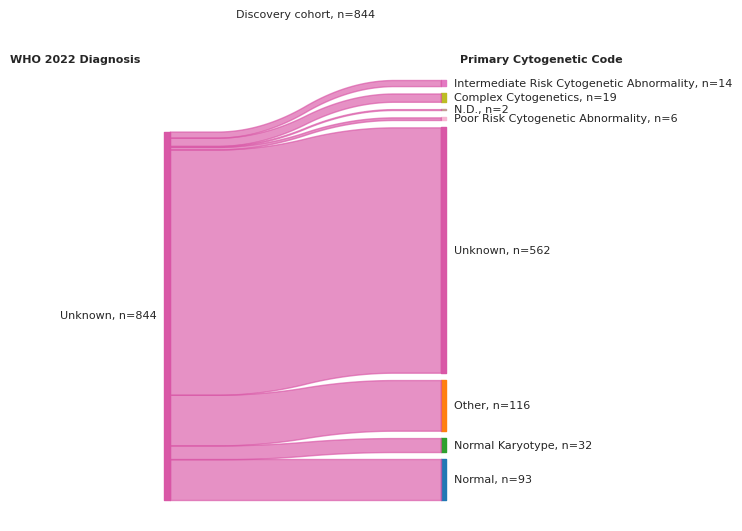

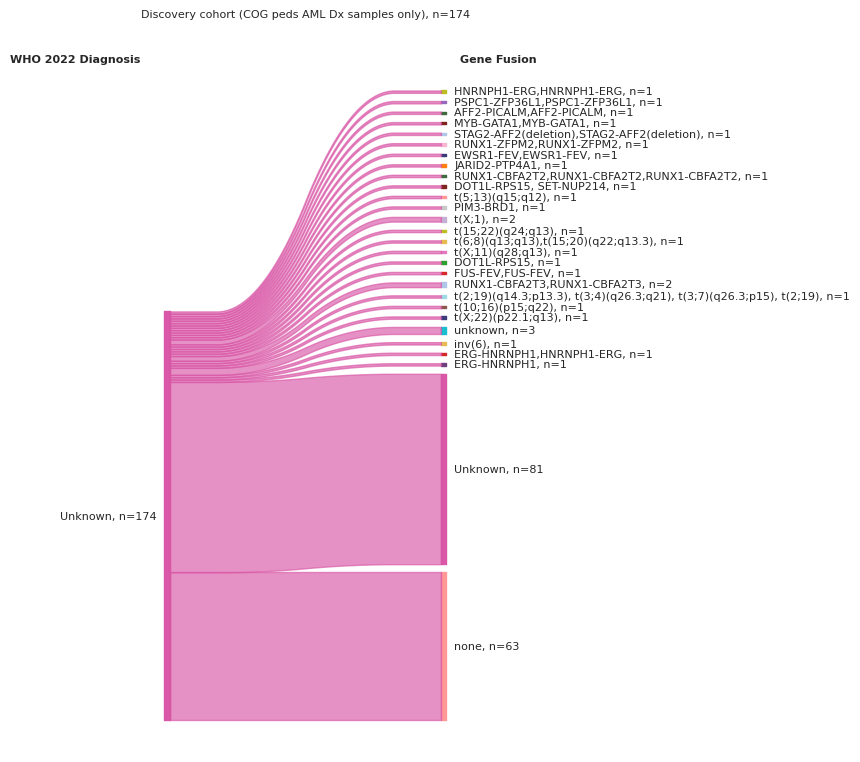

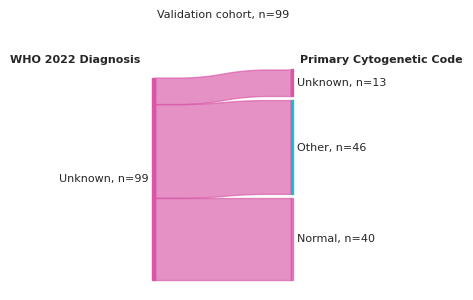

In [46]:
draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'Primary Cytogenetic Code', colors,
                 title='Discovery cohort', fig_size=(4, 6),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_px2, 'WHO 2022 Diagnosis', 'Gene Fusion', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(4, 9),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'Primary Cytogenetic Code', colors,
                 title= 'Validation cohort',fig_size=(2, 3),
                 fontsize=8, nan_action='keep only')

### Risk group comparison in COG

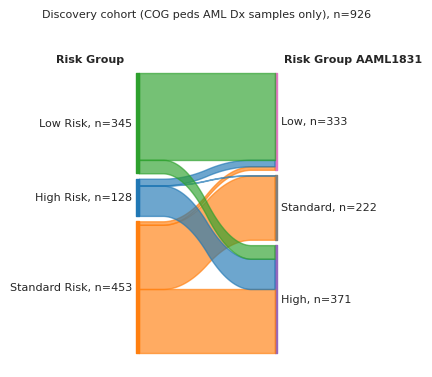

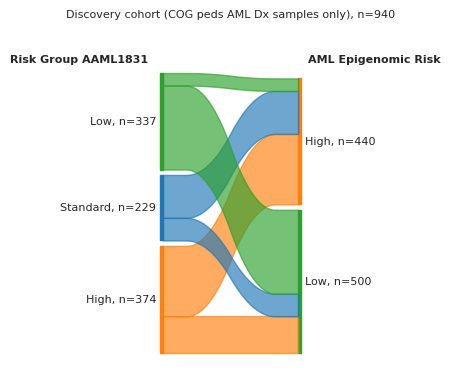

In [47]:
draw_sankey_plot(df_px2, 'Risk Group', 'Risk Group AAML1831', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(2, 4),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_px2, 'Risk Group AAML1831', 'AML Epigenomic Risk', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(2, 4),
                 fontsize=8, nan_action='drop')

### Px and Dx model comparison

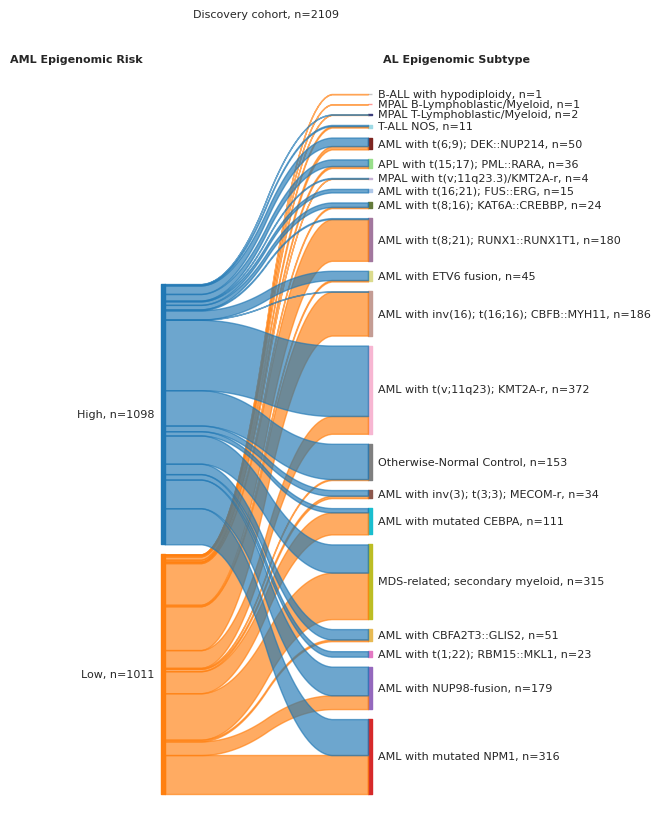

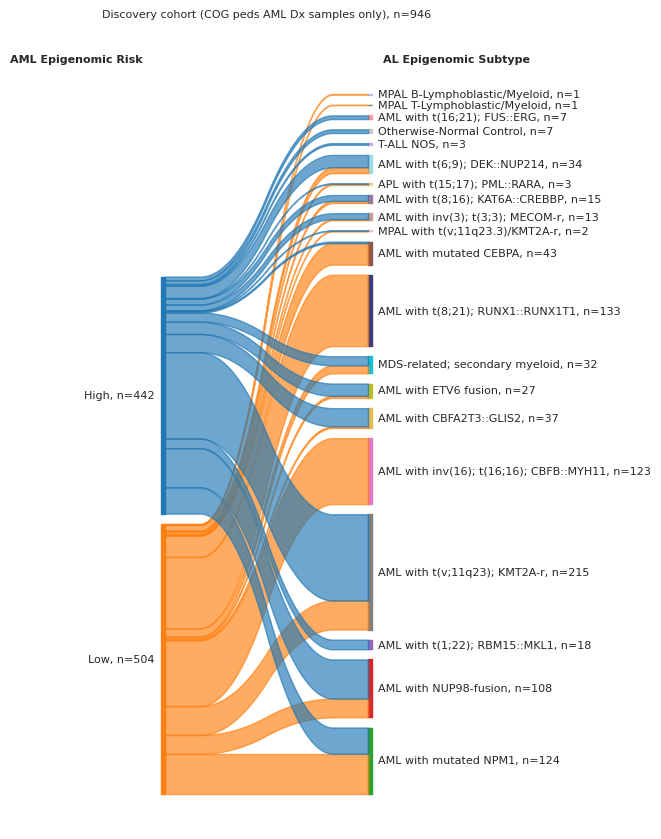

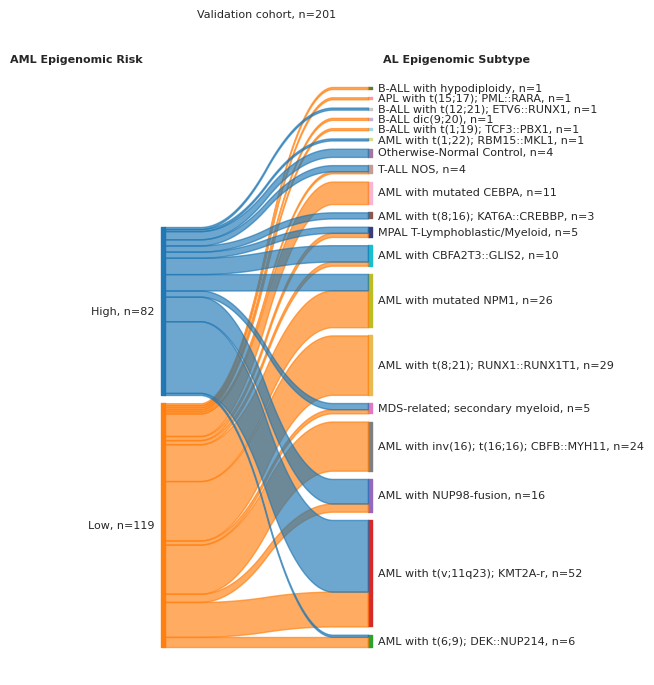

In [48]:
draw_sankey_plot(df_train, 'AML Epigenomic Risk', 'AL Epigenomic Subtype', colors,
                 title='Discovery cohort', fig_size=(3, 10),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_px2, 'AML Epigenomic Risk', 'AL Epigenomic Subtype', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(3, 10),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_test, 'AML Epigenomic Risk', 'AL Epigenomic Subtype', colors,
                 title= 'Validation cohort',fig_size=(3, 8),
                 fontsize=8, nan_action='drop')

## Watermark

In [49]:
%load_ext watermark

In [50]:
# watermark with all libraries used in this notebook
%watermark -v -p pandas,seaborn,matplotlib,tableone,sklearn,lifelines, -a Francisco_Marchi@Lamba_Lab_UF -d -m

Author: Francisco_Marchi@Lamba_Lab_UF

Python implementation: CPython
Python version       : 3.10.13
IPython version      : 8.20.0

pandas         : 2.2.0
seaborn        : 0.13.2
matplotlib     : 3.8.2
tableone       : 0.8.0
sklearn        : 1.4.0
lifelines      : 0.28.0
statannotations: not installed

Compiler    : GCC 11.4.0
OS          : Linux
Release     : 5.15.133.1-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 32
Architecture: 64bit

